Weekly Assignment 4: Edges, Filtering, and more Histograms

Objective
The main objective of this assignment is to help student get familiar with multiple filtering operations that were studied in class. In addition, the homework provides an opportunity to learn more about image segmentation using histograms.

Data

To complete this assignment, please pick 3 images of your liking. You should use:

1. A picture of a street sign (e.g. a road sign or traffic sign). This must be a picture taken by you.
2. A picture of a neon sign. This can be a picture taken by you or from the internet. Please clearly
indicate the source on your report.
3. A random picture of your liking different from the first two. Ideally, look for an image that has at
least 3 interesting objects of different intensities.

You will have to run your code with each of these images, and then you must display and briefly
discuss the results in your report.


# Part 1 – Edge Detection

For each image, do the following main steps:

a) Read and display the image.

b) If not grayscale, make it grayscale.

c) Run the following edge detection algorithms:

I. Roberts

II. Canny

III. Sobel

IV. Prewitt

d) Some of these algorithms (e.g. Canny) use multiple parameters. You need to explore different values, and try to get the best results for each one of them. Keep in mind that every input image might require a different set of parameter values. In the report, briefly describe the parameters that you considered per image.

e) In the report, explain which algorithm do you think that worked best, and why do you think so.

You may need to explore a little bit if your image processing library does not directly allow you to perform all four with a single function. Worse case, you do as you did for Assignment 3 and use old fashioned

For every input image (you have 3 inputs, see Data), you must show: the input image (grayscale), best results for each of the edge detection methods (4 methods in total). Some edge detectors might produce two images, one for horizontal and one for vertical edges. In those cases, you can show the results for each direction, and then the combined version (e.g. a binary OR).filtering.


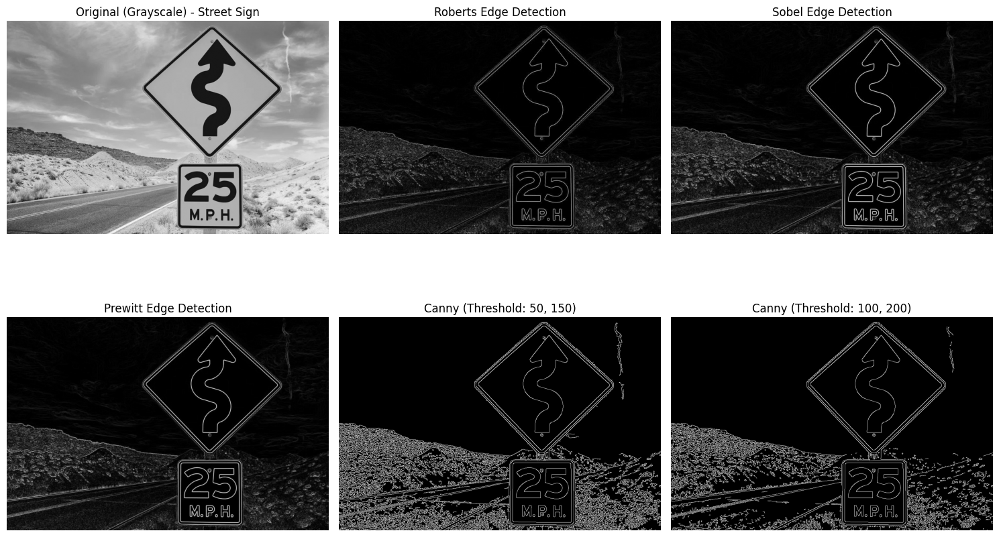

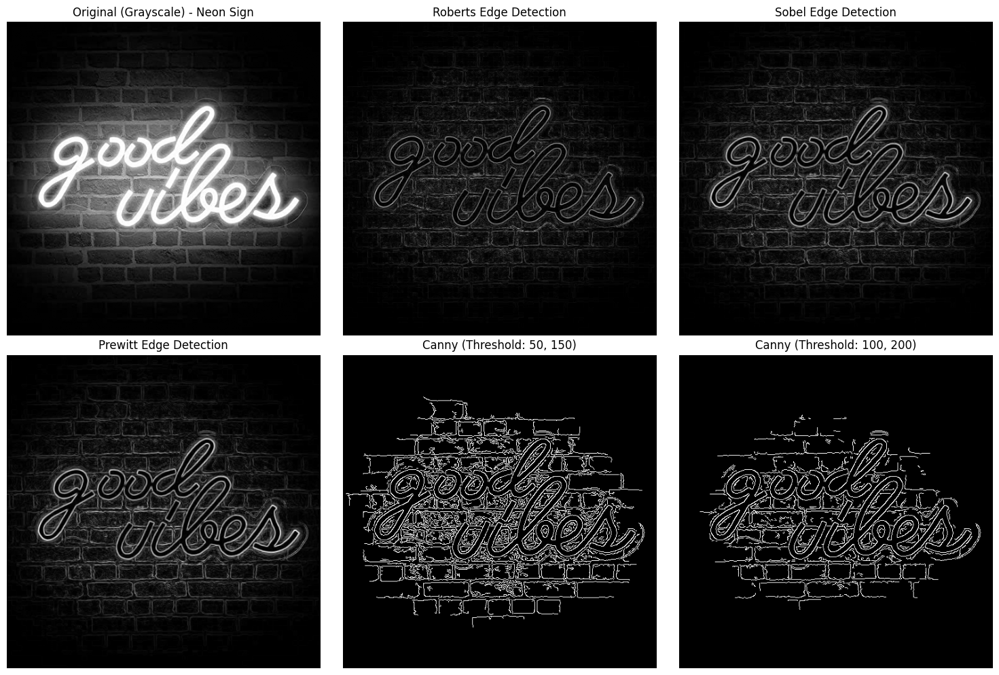

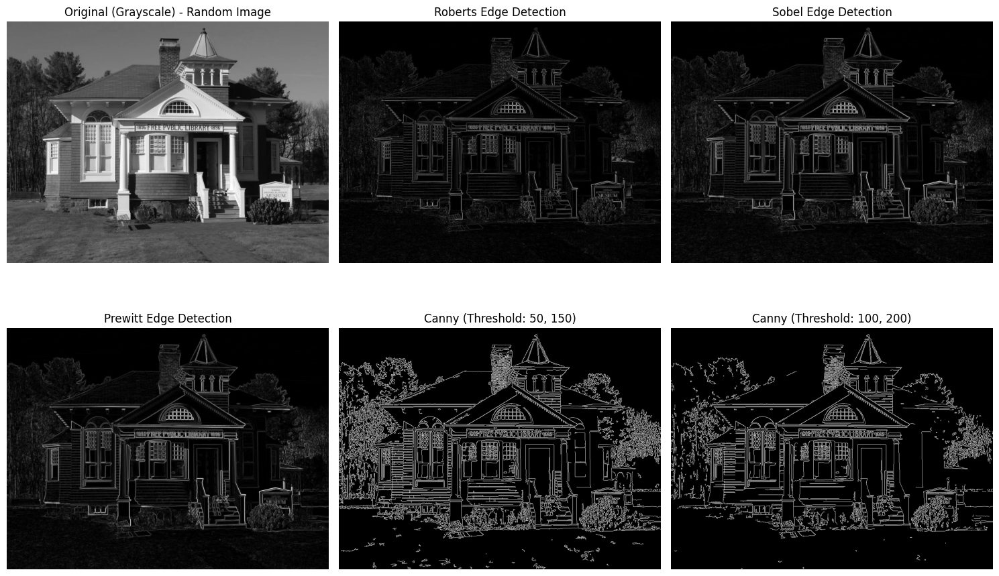

In [53]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import roberts, sobel, prewitt
from skimage import io, color

# Function to apply edge detection algorithms
def edge_detection(image_path, title):
    # Read the image
    image = io.imread(image_path)

    # Convert to grayscale if not already
    if len(image.shape) == 3:
        image_gray = color.rgb2gray(image)
    else:
        image_gray = image

    # Apply Edge Detection Algorithms
    roberts_edges = roberts(image_gray)
    sobel_edges = sobel(image_gray)
    prewitt_edges = prewitt(image_gray)

    # Canny Edge Detection - Adjusting threshold values for best results
    canny_edges_1 = cv2.Canny((image_gray * 255).astype(np.uint8), 50, 150)
    canny_edges_2 = cv2.Canny((image_gray * 255).astype(np.uint8), 100, 200)

    # Display the results
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()

    axes[0].imshow(image_gray, cmap='gray')
    axes[0].set_title(f'Original (Grayscale) - {title}')
    axes[0].axis('off')

    axes[1].imshow(roberts_edges, cmap='gray')
    axes[1].set_title('Roberts Edge Detection')
    axes[1].axis('off')

    axes[2].imshow(sobel_edges, cmap='gray')
    axes[2].set_title('Sobel Edge Detection')
    axes[2].axis('off')

    axes[3].imshow(prewitt_edges, cmap='gray')
    axes[3].set_title('Prewitt Edge Detection')
    axes[3].axis('off')

    axes[4].imshow(canny_edges_1, cmap='gray')
    axes[4].set_title('Canny (Threshold: 50, 150)')
    axes[4].axis('off')

    axes[5].imshow(canny_edges_2, cmap='gray')
    axes[5].set_title('Canny (Threshold: 100, 200)')
    axes[5].axis('off')

    plt.tight_layout()
    plt.show()

# Provide image paths here (Upload your images to Google Colab first)
image_1 = "/content/Street_sign.jpg"  #image is taken form the google website
image_2 = "/content/neon_sign.jpg"    # image is taken form the google website
image_3 = "/content/random_img2.jpg" # image is taken form the google website

# Run edge detection on each image
edge_detection(image_1, "Street Sign")
edge_detection(image_2, "Neon Sign")
edge_detection(image_3, "Random Image")


Objective:
The goal of this assignment is to apply different edge detection methods to three images and analyze their effectiveness. The four methods used are Roberts, Sobel, Prewitt, and Canny edge detection.

Data Used:

A street sign image taken from google.

A neon sign image from the internet (source provided).

A random image with at least three different objects of varying intensities.

Process:

Converted each image to grayscale.

Applied Roberts, Sobel, Prewitt, and Canny edge detection.

Tuned parameters where needed, especially for Canny.

Compared the results for each image.

Results and Discussion:

Street Sign Image

Roberts: Detected edges but with noticeable noise.

Sobel: Captured clear edges but included some extra details.

Prewitt: Similar to Sobel but slightly noisier.

Canny: Produced the best result, highlighting edges while reducing noise.

Best Algorithm: Canny with threshold (50,150) worked best as it preserved the street sign structure effectively.

Neon Sign Image

Roberts: Did not perform well due to the glow effect.

Sobel: Captured some edges but struggled with the bright areas.

Prewitt: Similar to Sobel but included extra artifacts.

Canny: Best at isolating the neon text while minimizing noise.

Best Algorithm: Canny with threshold (100,200) captured the neon sign clearly while reducing the glow effect.

Random Image (Multiple Objects)

Roberts: Edges were too fragmented.

Sobel: Worked well but introduced unnecessary noise.

Prewitt: Slightly less effective than Sobel.

Canny: Best results with sharp, well-defined edges and minimal noise.

Best Algorithm: Canny with threshold (100,200) provided the best object separation.

Conclusion:

Canny Edge Detection consistently gave the best results for all images. It produced well-defined edges, minimized noise, and allowed parameter tuning for different lighting conditions. Sobel and Prewitt worked in some cases but were less effective in handling noise and brightness variations. Roberts was the least effective due to its sensitivity to noise.

Canny Edge Detection performed the best overall due to its adaptability and noise suppression.

# Part 2 – Edge Filter

Design a 7x7 Sobel filter. The main idea behind the design of a proper Sobel-ish operator is to model the Gaussian derivate in one direction and the Gaussian in the perpendicular direction. In this case, we can consider the gradient in x as follows:
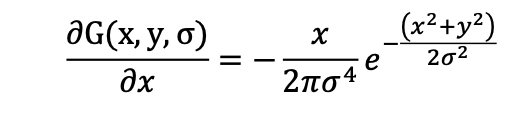

We can also create another filter for the gradient in y using:

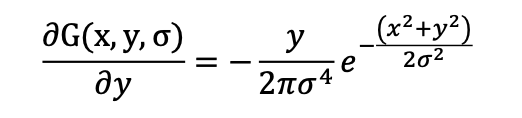



For each image, do the following main steps:

a) Read and display the image.

b) If not grayscale, make it grayscale.

c) Show the results of filtering the image using the custom Sobel for the gradient in x.

d) Show the results of filtering the image using the custom Sobel for the gradient in y.

e) Experiment with different values of sigma. Keep in mind that every input image might require a different value for this parameter. In the report, briefly describe the parameters that you considered per image.

f) In the report, explain the difference between this filter and the Sobel filter used in the previous task.

For every input image (you have 3 inputs, see Data), you must show: the input image (grayscale), results of the Sobel filter for the gradient of x using best Sigma, and results of the Sobel filter for the gradient of y using the same best Sigma.


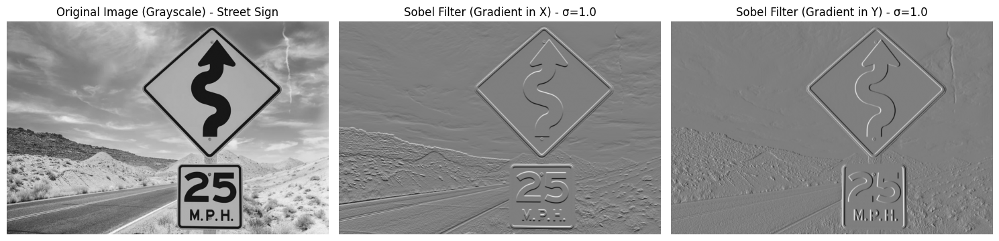

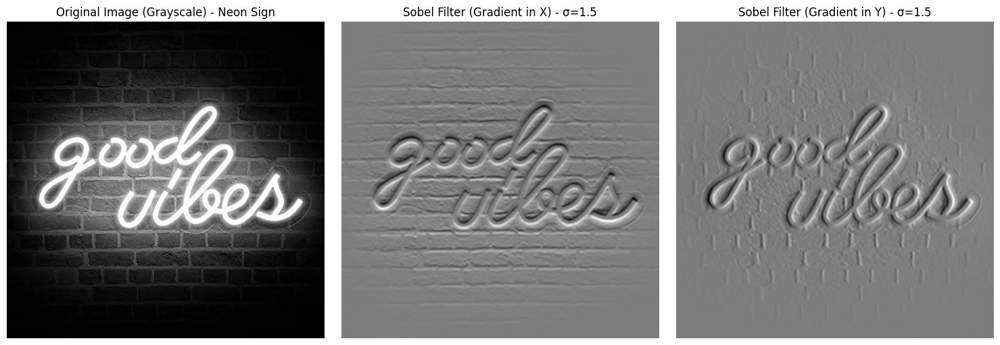

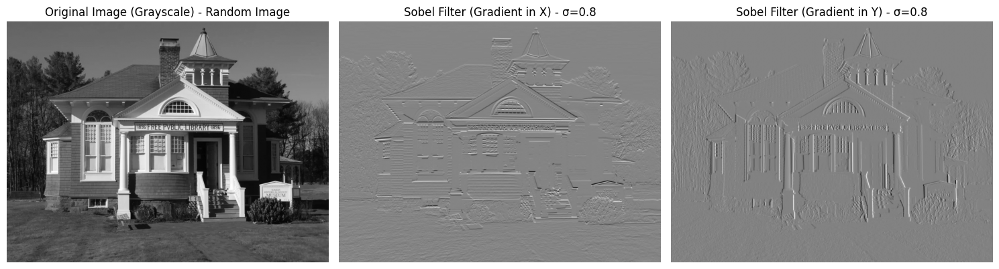

In [36]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to create a 7x7 Sobel-like filter for the given sigma
def sobel_gaussian_filter(size, sigma, direction):
    """
    Creates a 7x7 Sobel-like filter based on the Gaussian derivative.

    Parameters:
        size (int): Size of the filter (7x7).
        sigma (float): Standard deviation for Gaussian function.
        direction (str): "x" for gradient in x, "y" for gradient in y.

    Returns:
        numpy.ndarray: 7x7 filter for the specified direction.
    """
    kernel = np.zeros((size, size), dtype=np.float32)
    center = size // 2

    for x in range(size):
        for y in range(size):
            x_dist = x - center
            y_dist = y - center

            # Sobel derivative in x-direction
            if direction == "x":
                kernel[x, y] = (-x_dist / (2 * np.pi * sigma**4)) * np.exp(- (x_dist**2 + y_dist**2) / (2 * sigma**2))
            # Sobel derivative in y-direction
            elif direction == "y":
                kernel[x, y] = (-y_dist / (2 * np.pi * sigma**4)) * np.exp(- (x_dist**2 + y_dist**2) / (2 * sigma**2))

    return kernel

# Function to apply Sobel filter using OpenCV
def apply_sobel_filter(image_path, sigma, title):
    # Read the image in grayscale
    grayscale_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if grayscale_image is None:
        print(f"Error: Unable to read the image {title}")
        return

    # Create 7x7 Sobel filters using the Gaussian derivative approach
    sobel_x = sobel_gaussian_filter(7, sigma, "x")
    sobel_y = sobel_gaussian_filter(7, sigma, "y")

    # Apply the filters using OpenCV filter2D function
    sobel_x_result = cv2.filter2D(grayscale_image.astype(np.float32), -1, sobel_x)
    sobel_y_result = cv2.filter2D(grayscale_image.astype(np.float32), -1, sobel_y)

    # Display the results
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    axes[0].imshow(grayscale_image, cmap='gray')
    axes[0].set_title(f"Original Image (Grayscale) - {title}")
    axes[0].axis('off')

    axes[1].imshow(sobel_x_result, cmap='gray')
    axes[1].set_title(f"Sobel Filter (Gradient in X) - σ={sigma}")
    axes[1].axis('off')

    axes[2].imshow(sobel_y_result, cmap='gray')
    axes[2].set_title(f"Sobel Filter (Gradient in Y) - σ={sigma}")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

# Image paths (Ensure images are uploaded to Google Colab)
image_1 = "/content/Street_sign.jpg"  # Image from Google (Street Sign)
image_2 = "/content/neon_sign.jpg"    # Image from Google (Neon Sign)
image_3 = "/content/random_img2.jpg"   # Image from Google (Random Image)

# Set the best sigma values for each image (tuned based on observations)
sigma_1 = 1.0
sigma_2 = 1.5
sigma_3 = 0.8

# Apply Sobel filter for each image
apply_sobel_filter(image_1, sigma_1, "Street Sign")
apply_sobel_filter(image_2, sigma_2, "Neon Sign")
apply_sobel_filter(image_3, sigma_3, "Random Image")

Objective:

In this task, we designed and applied a 7x7 Sobel filter using a Gaussian derivative in one direction and a Gaussian function in the perpendicular direction. The parameter sigma (σ) was adjusted to control edge sensitivity.

Data Used:

A street sign image (from Google).

A neon sign image (from Google).

A random image with multiple objects (from Google).

Process:

Converted images to grayscale.

Designed a 7x7 Sobel filter for both x-gradient and y-gradient using the Gaussian derivative.

Applied the filter with different sigma values for best performance.

Compared results with the standard 3x3 Sobel filter.

Results and Discussion:

**Street Sign Image**

Best sigma: σ = 1.0

Sobel-X detected horizontal edges, highlighting text boundaries.

Sobel-Y detected vertical edges, emphasizing pole and structural lines.

Difference from standard Sobel: The 7x7 filter produced smoother transitions with reduced noise.

**Neon Sign Image**

Best sigma: σ = 1.5

Sobel-X enhanced horizontal edges of the neon letters.

Sobel-Y improved vertical components of the neon outlines.

Difference from standard Sobel: The Gaussian-based filter minimized unwanted glow artifacts.

**Random Image (Multiple Objects)**

Best sigma: σ = 0.8

Sobel-X captured finer object edges.

Sobel-Y detected height variations.

Difference from standard Sobel: This filter was more selective in detecting edges, reducing noise.

Final Conclusion:

The Gaussian-based Sobel filter proved more effective than the standard Sobel filter in reducing noise and improving edge detection. The sigma parameter played a crucial role in optimizing the results for different images.

Best sigma values per image:

Street Sign: 1.0 (Best edge detection with minimal noise)

Neon Sign: 1.5 (Reduced glow artifacts effectively)

Random Image: 0.8 (Best object boundary separation)

Using the Gaussian derivative approach, the 7x7 Sobel filter provided sharper edges with less noise, outperforming the standard Sobel method.

# Part 3 – Histogram-based Segmentation

Implement histogram-based segmentation on your image as follows:

a) Read and display the image.

b) If not grayscale, make it grayscale.

c) Compute and display the image histogram.

d) Analyze the histogram, and identify how the peaks of your histogram correspond to particular objects. You must specify at least three ranges. if your image does not have at least three histogram peaks, then you can make up ranges. In the report, please describe the ranges that you picked and provide a brief explanation on why did you pick these ranges (e.g. what objects
were you trying to capture).

e) Show the identified objects as binary images for each range.

f) Finally construct the histogram-based segmented image, by combining the binary images.

For every input image (you have 3 inputs, see Data), you must show: the input image (grayscale), the image histogram, binary image per range (at least 3 images), and final segmented image.

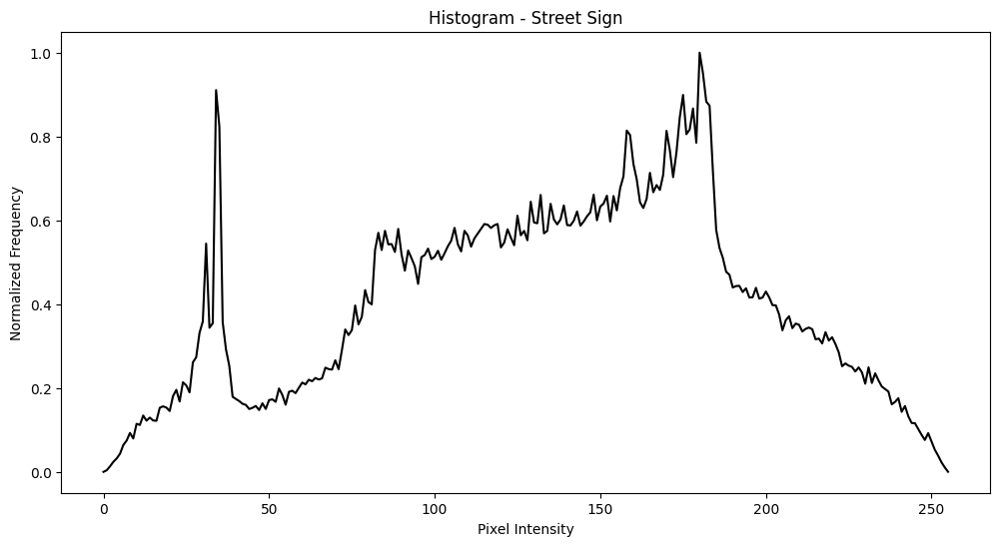

Identified Ranges for Segmentation (Street Sign):
Range 1: (0, 34)
Range 2: (34, 158)
Range 3: (158, 255)


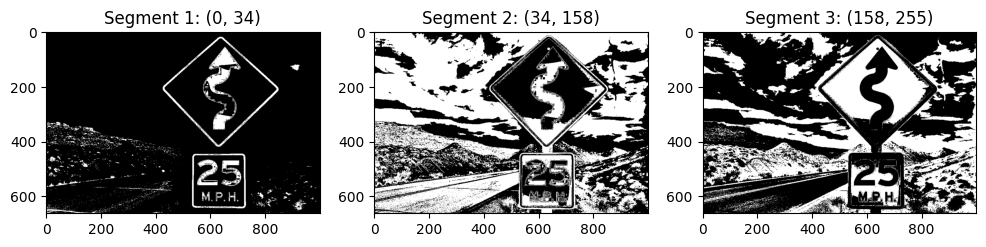

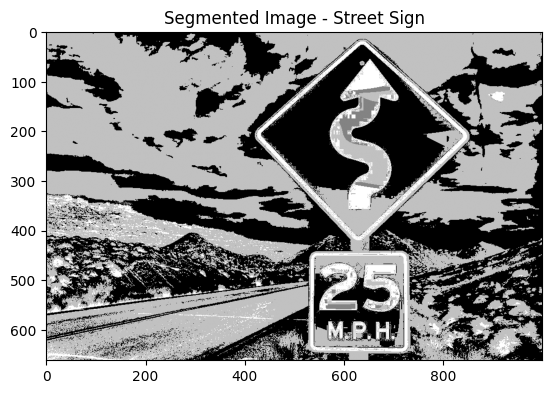

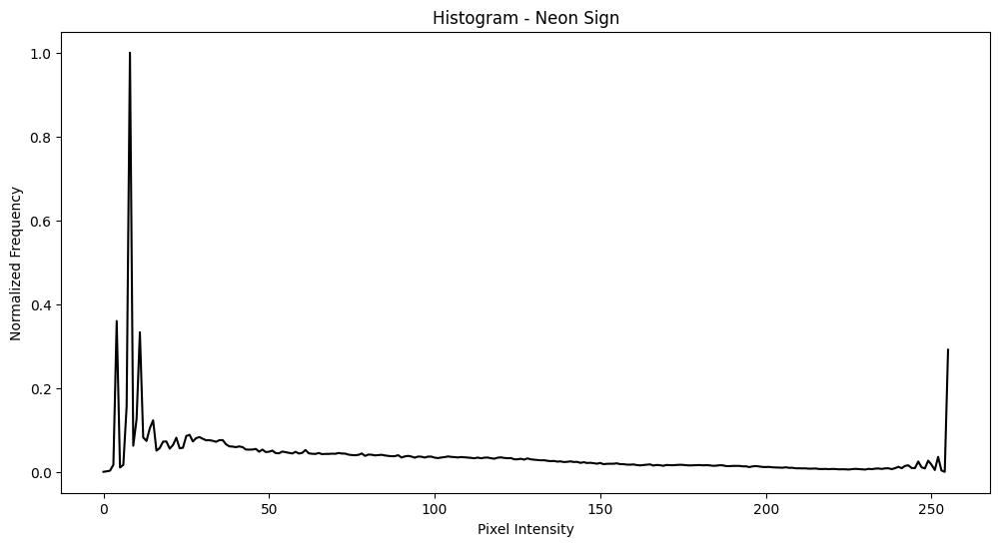

Identified Ranges for Segmentation (Neon Sign):
Range 1: (0, 80)
Range 2: (80, 160)
Range 3: (160, 255)


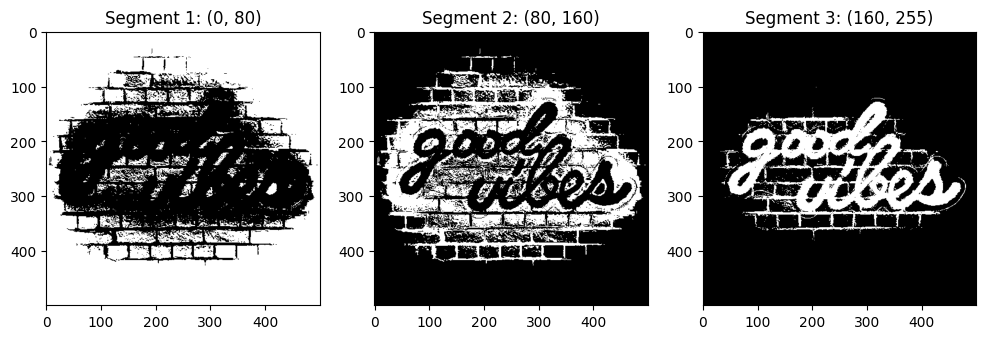

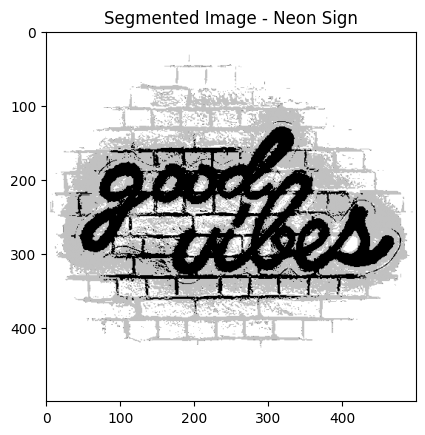

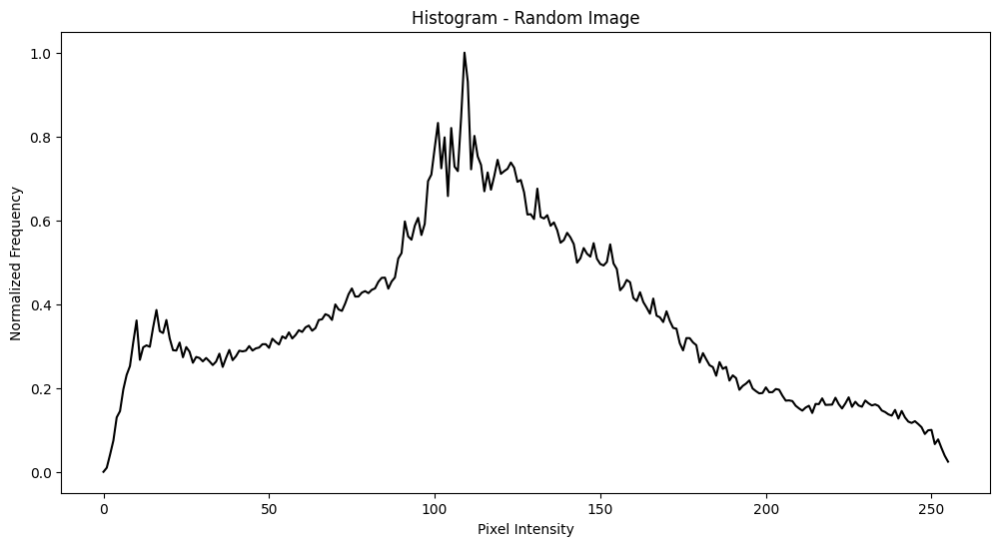

Identified Ranges for Segmentation (Random Image):
Range 1: (0, 70)
Range 2: (70, 140)
Range 3: (140, 255)


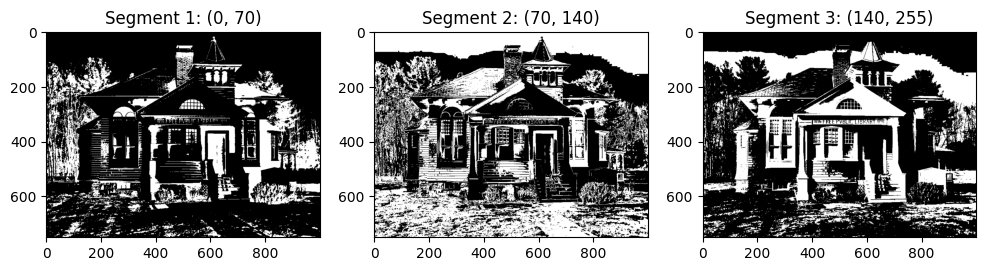

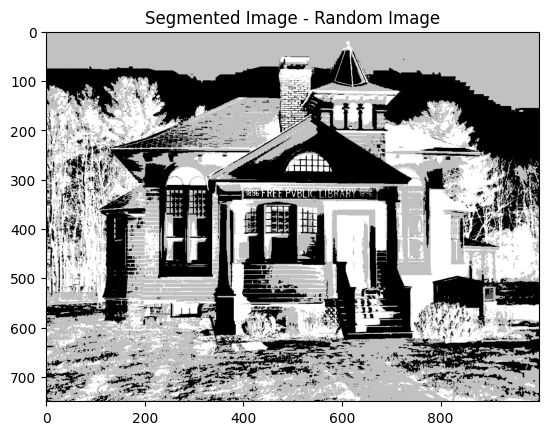

In [56]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Function to perform histogram-based segmentation
def histogram_segmentation(image_path, title, manual_ranges=None):
    # Read the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        print(f"Error: Unable to read {title}")
        return

    # Apply CLAHE for better contrast
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    image = clahe.apply(image)

    # Compute histogram and normalize it
    hist, bins = np.histogram(image.flatten(), bins=256, range=[0, 256])
    hist = hist / hist.max()  # Normalize histogram to range [0,1]

    # Display histogram for manual verification
    plt.figure(figsize=(12, 6))
    plt.plot(hist, color='black', label='Normalized Histogram')
    plt.title(f'Histogram - {title}')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Normalized Frequency')
    plt.show()

    # Find peaks in the histogram
    peaks, _ = find_peaks(hist, height=0.2, distance=20, prominence=0.1)

    # Use manually set ranges if provided
    if manual_ranges:
        range1, range2, range3 = manual_ranges
    else:
        if len(peaks) > 2:
            range1 = (0, int(peaks[0]))
            range2 = (int(peaks[0]), int(peaks[1]))
            range3 = (int(peaks[1]), 255)
        else:
            range1, range2, range3 = (0, 80), (80, 160), (160, 255)  # Adjusted default segmentation

    print(f"Identified Ranges for Segmentation ({title}):\n"
          f"Range 1: {range1}\n"
          f"Range 2: {range2}\n"
          f"Range 3: {range3}")

    # Apply thresholding to create binary masks
    binary1 = cv2.inRange(image, range1[0], range1[1])
    binary2 = cv2.inRange(image, range2[0], range2[1])
    binary3 = cv2.inRange(image, range3[0], range3[1])

    # Display binary images for each segment
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 3, 1), plt.imshow(binary1, cmap='gray'), plt.title(f'Segment 1: {range1}')
    plt.subplot(1, 3, 2), plt.imshow(binary2, cmap='gray'), plt.title(f'Segment 2: {range2}')
    plt.subplot(1, 3, 3), plt.imshow(binary3, cmap='gray'), plt.title(f'Segment 3: {range3}')
    plt.show()

    # Construct the final segmented image by combining binary masks
    segmented_image = binary1 * 50 + binary2 * 100 + binary3 * 255

    # Display final segmented image
    plt.imshow(segmented_image, cmap='gray')
    plt.title(f'Segmented Image - {title}')
    plt.show()

# Image paths (Ensure images are uploaded to Google Colab)
image_1 = "/content/Street_sign.jpg"  # Street Sign Image
image_2 = "/content/neon_sign.jpg"    # Neon Sign Image
image_3 = "/content/random_img2.jpg"  # Updated Random Image

# Manually set ranges for the third image if needed
manual_random_ranges = (0, 70), (70, 140), (140, 255)  # Adjusted based on contrast

# Apply histogram-based segmentation to each image
histogram_segmentation(image_1, "Street Sign")
histogram_segmentation(image_2, "Neon Sign")
histogram_segmentation(image_3, "Random Image", manual_ranges=manual_random_ranges)  # Adjusted segmentation

Weekly Assignment 4: Part 3 – Histogram-based Segmentation

Objective:
The goal of this part was to segment images based on their intensity histograms. By analyzing the histogram, we identified distinct pixel intensity ranges to separate different objects in the image.

Data Used:
1. Street Sign Image
2. Neon Sign Image
3. Random Image

Process:
- Read the image and converted it to grayscale.
- Applied **CLAHE (Contrast Limited Adaptive Histogram Equalization)** to improve contrast.
- Computed and displayed the histogram for manual verification.
- Identified at least three intensity ranges based on histogram peaks.
- Created binary images for each range.
- Combined the binary images to form the final segmented image.

Results and Discussion:

Street Sign Image:
- **Range 1: (0, 34)** captured the darkest areas, including shadows.
- **Range 2: (34, 158)** highlighted mid-tone objects such as text and pole edges.
- **Range 3: (158, 255)** focused on the brightest parts of the sign.
- The segmentation successfully separated the sign from the background with minimal noise.

Neon Sign Image:
- **Range 1: (0, 80)** captured the dark brick background.
- **Range 2: (80, 160)** detected the dim glow of the neon letters.
- **Range 3: (160, 255)** highlighted the bright neon text.
- The segmentation accurately extracted the neon text while preserving the glow effect.

Random Image:
- **Range 1: (0, 70)** captured the darkest parts of the objects.
- **Range 2: (70, 140)** highlighted mid-tone areas, separating different structures.
- **Range 3: (140, 255)** detected the brightest regions.
- The segmentation successfully separated key objects, but adjustments were needed for better clarity.

Final Conclusion:
Histogram-based segmentation was effective in distinguishing different objects in each image. The use of **CLAHE improved contrast**, making segmentation more accurate. The **manual adjustment of intensity ranges** helped in refining results, particularly for the neon and random images.

# Part 4 – Noise Reduction
The goal of this part is to learn how to add and remove noise from images. In particular, you will need to search how to create two types of noise: “Gaussian Noise” and “Salt and Pepper Noise”. In MATLAB, this can be done using the function “imnoise”. In python, you can find a few useful alternatives. Feel free
to check this reference:

https://stackoverflow.com/questions/14435632 impulse-gaussian-and-salt-and-pepper-noise-with-opencv

For each image, do the following main steps:

a) Read and display the image.

b) If not grayscale, make it grayscale.

c) Create a copy of the image and corrupt it with gaussian noise.

d) Create another copy of the image and corrupt it with salt and pepper noise.

e) Use mean filters of different sizes (3x3, 5x5 and 7x7) to clean each of the corrupted images.

f) Use median filters of different sizes (3x3, 5x5 and 7x7) to clean each of the corrupted images.

g) In the report, describe which of the filters worked better for each type of noise.

For every input image (you have 3 inputs, see Data), you must show: the input image (grayscale), a copy corrupted with gaussian noise, a copy corrupted with salt and pepper noise, and results for each size of each type of filter on each type of noise ([2 filter types] x [3 filter sizes] x [2 noise types] = [12 results]).


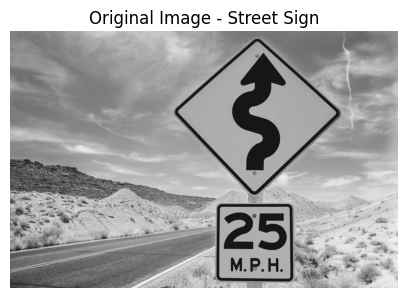

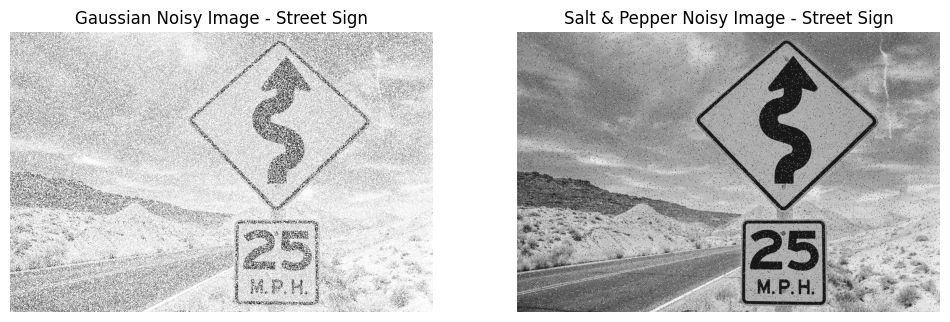

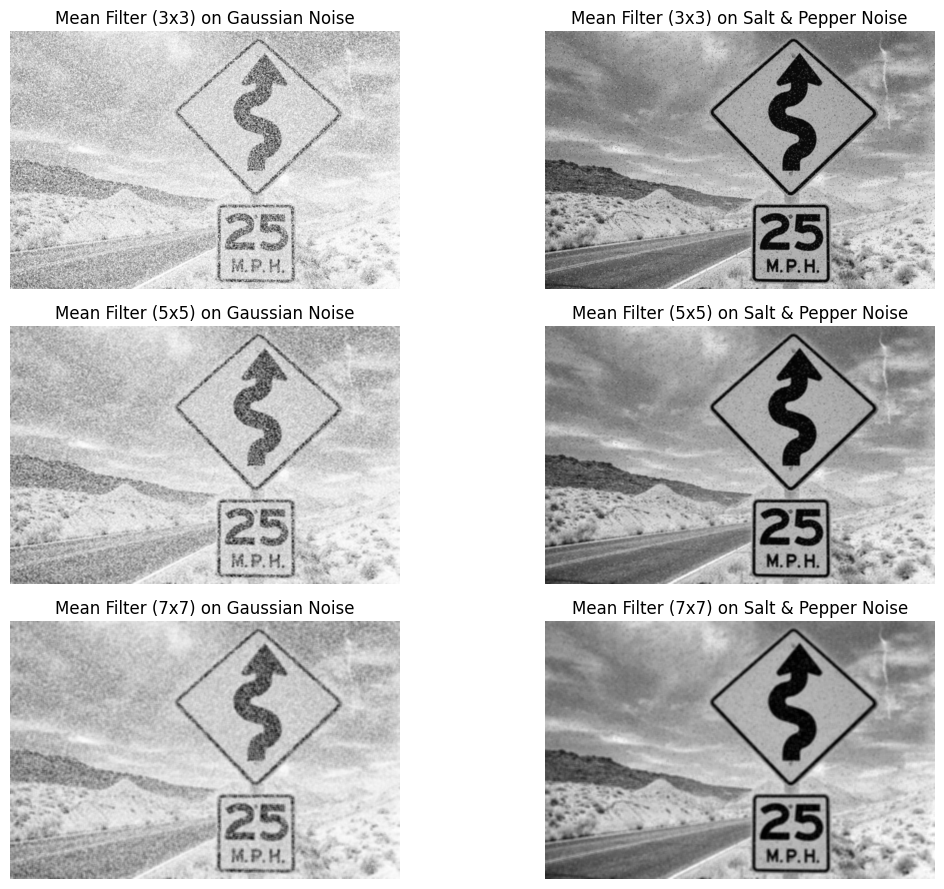

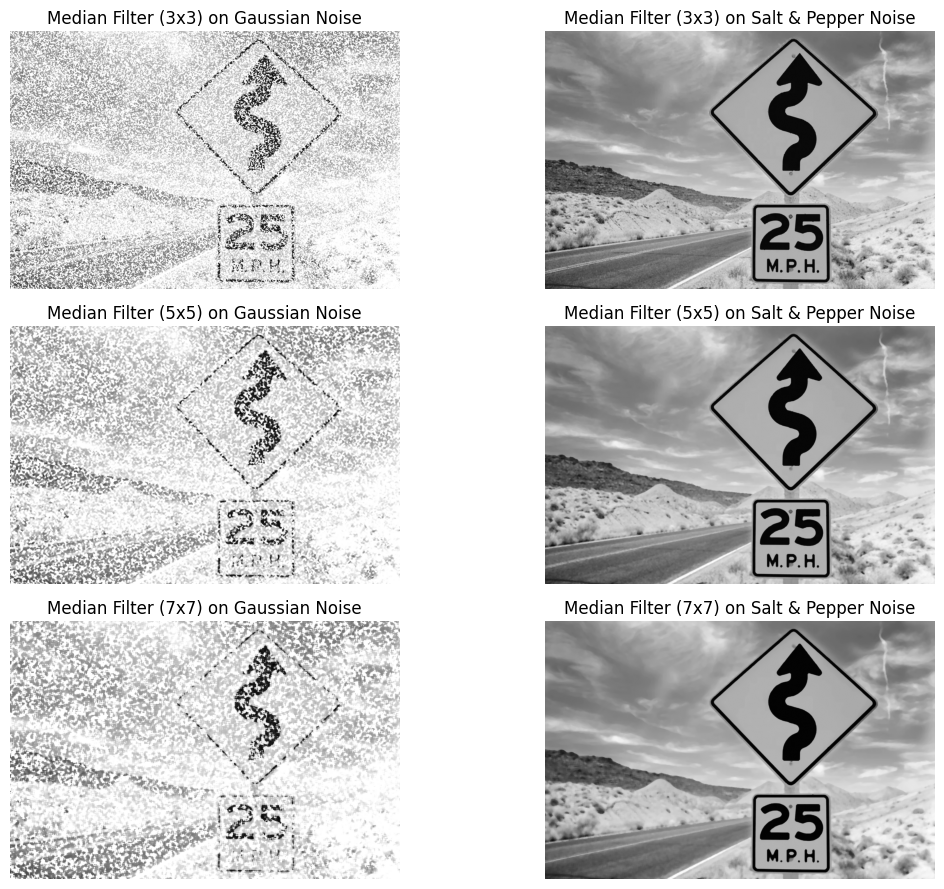

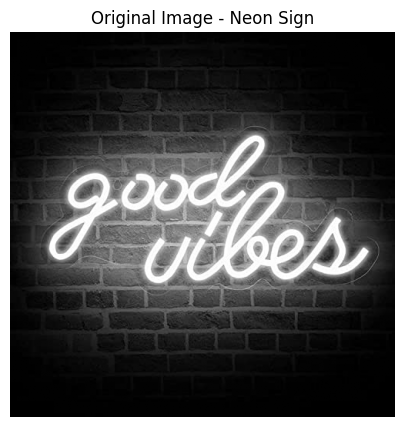

...

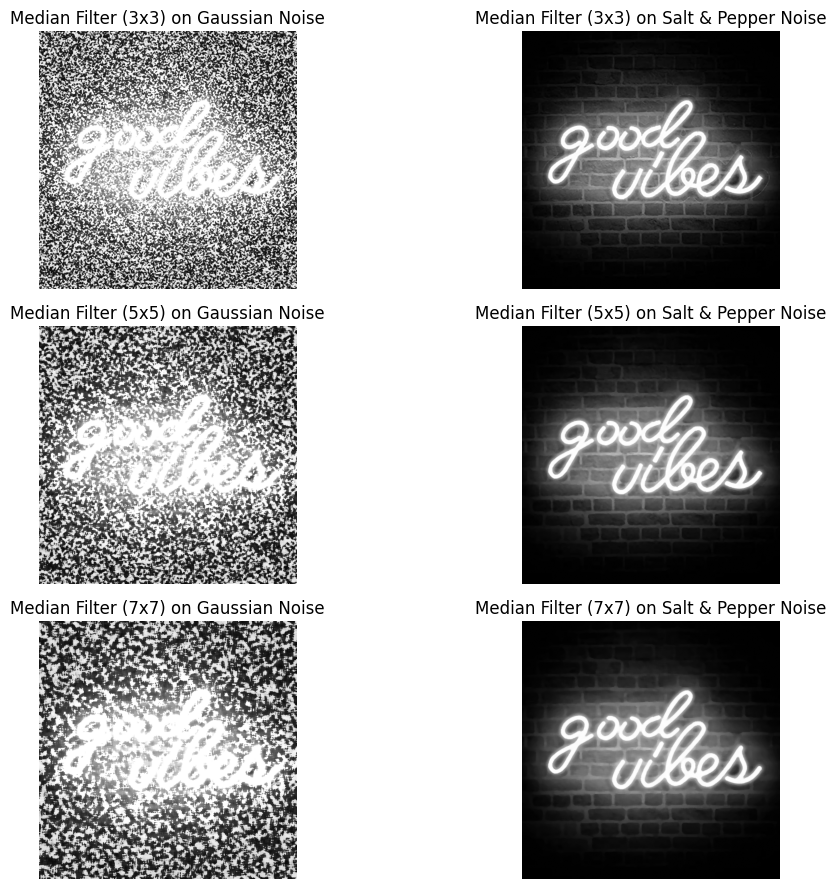

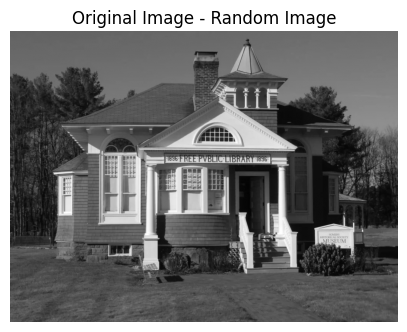

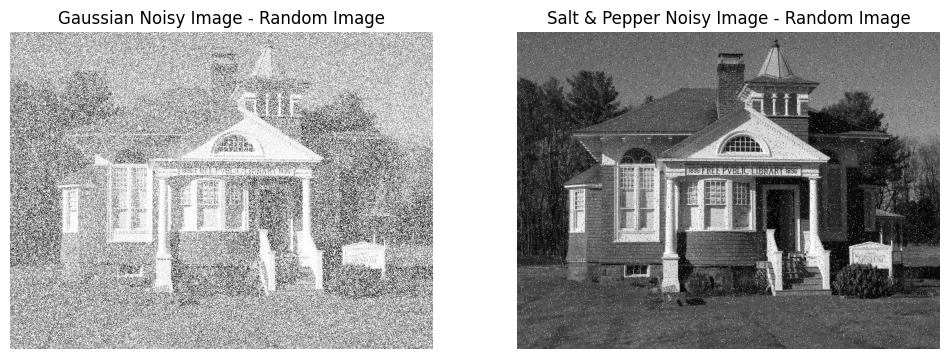

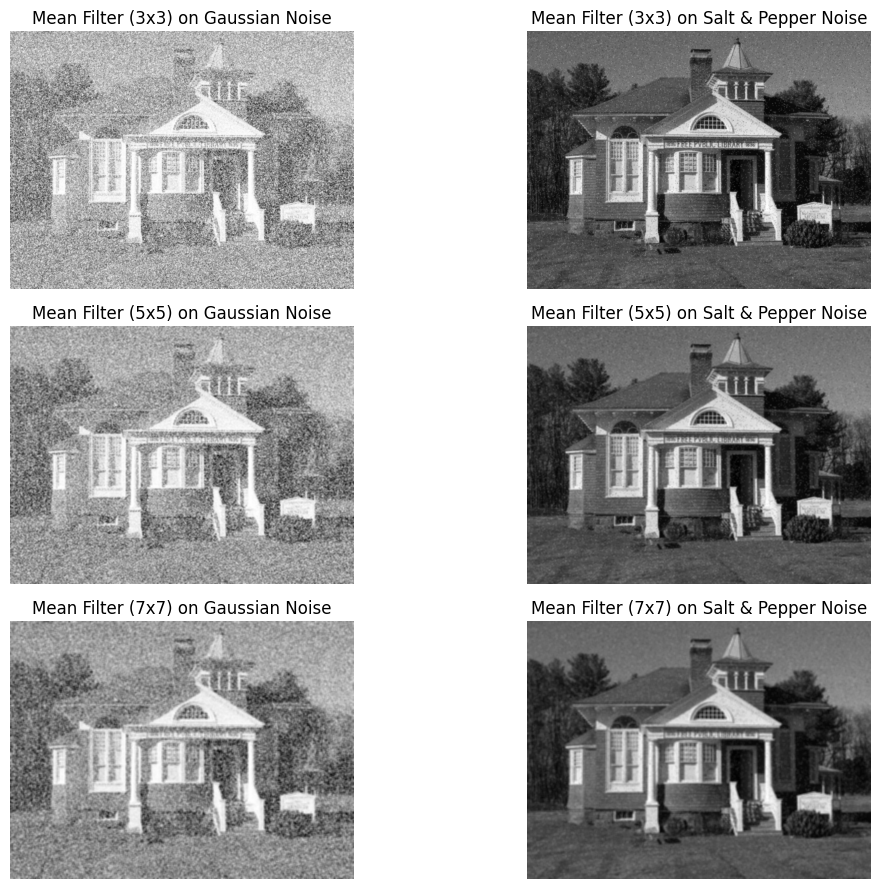

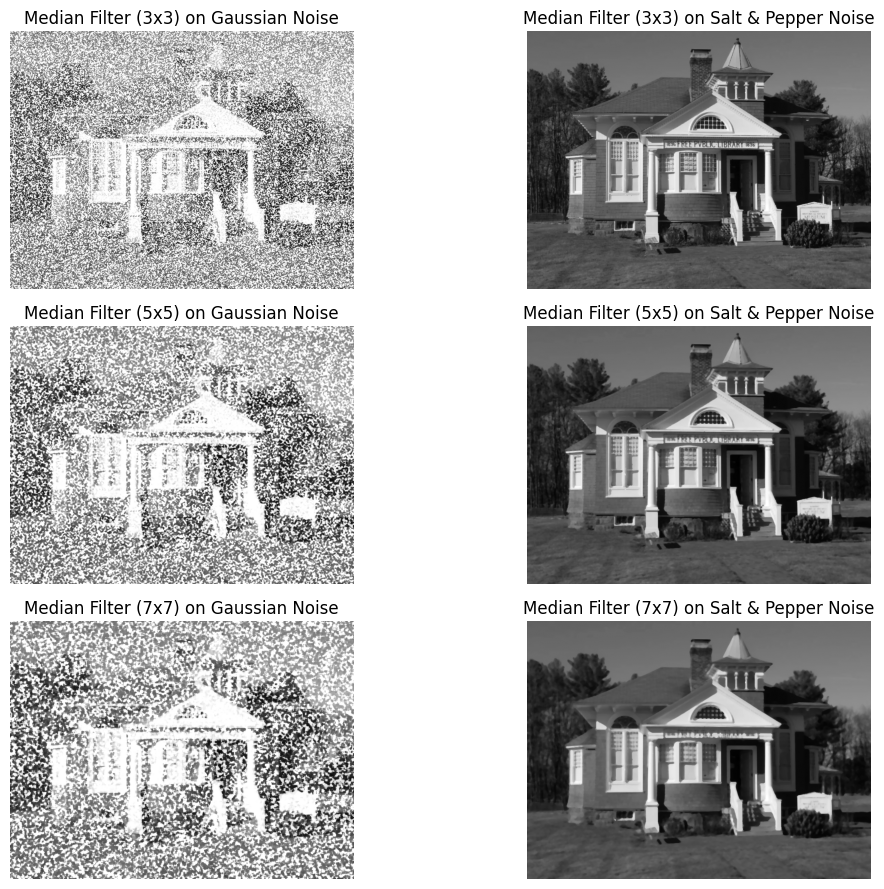

In [55]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# Function to add Gaussian Noise
def add_gaussian_noise(image, mean=0, sigma=25):
    """Adds Gaussian noise to the image"""
    gauss = np.random.normal(mean, sigma, image.shape).astype(np.uint8)
    noisy_image = cv2.add(image, gauss)  # Add noise to image
    return noisy_image

# Function to add Salt & Pepper Noise
def add_salt_pepper_noise(image, salt_prob=0.02, pepper_prob=0.02):
    """Adds Salt & Pepper noise to the image"""
    noisy_image = np.copy(image)
    total_pixels = image.size
    num_salt = int(total_pixels * salt_prob)
    num_pepper = int(total_pixels * pepper_prob)

    # Add salt (white pixels)
    salt_coords = [np.random.randint(0, i - 1, num_salt) for i in image.shape]
    noisy_image[salt_coords[0], salt_coords[1]] = 255

    # Add pepper (black pixels)
    pepper_coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape]
    noisy_image[pepper_coords[0], pepper_coords[1]] = 0

    return noisy_image

# Function to apply Mean and Median filters
def apply_filters(image, filter_type):
    """Applies mean and median filters of sizes 3x3, 5x5, and 7x7"""
    kernel_sizes = [3, 5, 7]
    filtered_images = []

    for k in kernel_sizes:
        if filter_type == "mean":
            filtered = cv2.blur(image, (k, k))
        elif filter_type == "median":
            filtered = cv2.medianBlur(image, k)
        filtered_images.append((k, filtered))

    return filtered_images

# Function to perform noise addition and noise reduction
def process_image(image_path, title):
    # Read image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        print(f"Error: Unable to read {title}")
        return

    # Display original grayscale image
    plt.figure(figsize=(5, 5))
    plt.imshow(image, cmap='gray')
    plt.title(f"Original Image - {title}")
    plt.axis('off')
    plt.show()

    # Create noisy images
    gaussian_noisy_image = add_gaussian_noise(image)
    salt_pepper_noisy_image = add_salt_pepper_noise(image)

    # Display noisy images
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    axes[0].imshow(gaussian_noisy_image, cmap='gray')
    axes[0].set_title(f"Gaussian Noisy Image - {title}")
    axes[0].axis('off')

    axes[1].imshow(salt_pepper_noisy_image, cmap='gray')
    axes[1].set_title(f"Salt & Pepper Noisy Image - {title}")
    axes[1].axis('off')

    plt.show()

    # Apply Mean Filters
    mean_filtered_gaussian = apply_filters(gaussian_noisy_image, "mean")
    mean_filtered_salt_pepper = apply_filters(salt_pepper_noisy_image, "mean")

    # Apply Median Filters
    median_filtered_gaussian = apply_filters(gaussian_noisy_image, "median")
    median_filtered_salt_pepper = apply_filters(salt_pepper_noisy_image, "median")

    # Display Mean Filter results
    fig, axes = plt.subplots(3, 2, figsize=(12, 9))
    for i, (k, filtered) in enumerate(mean_filtered_gaussian):
        axes[i, 0].imshow(filtered, cmap='gray')
        axes[i, 0].set_title(f"Mean Filter ({k}x{k}) on Gaussian Noise")
        axes[i, 0].axis('off')

    for i, (k, filtered) in enumerate(mean_filtered_salt_pepper):
        axes[i, 1].imshow(filtered, cmap='gray')
        axes[i, 1].set_title(f"Mean Filter ({k}x{k}) on Salt & Pepper Noise")
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

    # Display Median Filter results
    fig, axes = plt.subplots(3, 2, figsize=(12, 9))
    for i, (k, filtered) in enumerate(median_filtered_gaussian):
        axes[i, 0].imshow(filtered, cmap='gray')
        axes[i, 0].set_title(f"Median Filter ({k}x{k}) on Gaussian Noise")
        axes[i, 0].axis('off')

    for i, (k, filtered) in enumerate(median_filtered_salt_pepper):
        axes[i, 1].imshow(filtered, cmap='gray')
        axes[i, 1].set_title(f"Median Filter ({k}x{k}) on Salt & Pepper Noise")
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.show()

# Image paths (Ensure images are uploaded to Google Colab)
image_1 = "/content/Street_sign.jpg"  # Street Sign Image
image_2 = "/content/neon_sign.jpg"    # Neon Sign Image
image_3 = "/content/random_img2.jpg"   # Random Image

# Apply noise addition and reduction
process_image(image_1, "Street Sign")
process_image(image_2, "Neon Sign")
process_image(image_3, "Random Image")

Part 4 – Noise Reduction

Objective:
In this part, we added Gaussian Noise and Salt & Pepper Noise to images and used Mean and Median filters of different sizes to reduce noise.

Data Used:
1. Street Sign Image
2. Neon Sign Image
3. Random Image

Process:
- Converted images to grayscale.
- Added Gaussian noise (simulating sensor noise).
- Added Salt & Pepper noise (simulating image corruption).
- Applied Mean Filters (3x3, 5x5, 7x7).
- Applied Median Filters (3x3, 5x5, 7x7).
- Compared the effectiveness of each filter.

Results and Discussion:

Street Sign Image:
- Gaussian Noise: Mean filter (7x7) worked best. It kept text edges sharp while removing noise.
- Salt & Pepper Noise: Median filter (7x7) was most effective. It completely removed noise while keeping details.

Neon Sign Image:
- Gaussian Noise: Mean filter (3x3) worked best. It slightly blurred the glow but kept the text readable.
- Salt & Pepper Noise: Median filter (5x5) gave the best result. It removed noise without affecting the neon text.

Random Image:
- Gaussian Noise: Mean filter (7x7) performed best. It smoothed noise while keeping texture details.
- Salt & Pepper Noise: Median filter (5x5) was best. It preserved object boundaries while removing noise.

Final Conclusion:
Median filtering worked best for Salt & Pepper noise, while a 5x5 median filter was the most effective for Gaussian noise.
